# Predictive Asthma Modeling

The objective of this workbook is to: 

- Collect and clean three datasets (asthma prevalence, social vulnerability indices, and air quality metrics). 

- Perform exploratory data analytics (EDA).

- Unsupervised modeling for feature engineering and data dimension reduction. 

- Supervised modeling for predicted asthma prevalence by census tract using the clustered features from the unsupervised model.

- Visualizations of final output and model. 

### Necessary Installs and Import Libraries

Uncomment the following block if networkx is not already installed in the environment.

In [1]:
!pip install networkx==3.4.2
!pip install xgboost==3.0.2


[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


In [2]:
import requests
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score,mean_squared_error, r2_score
from sklearn.neighbors import kneighbors_graph
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import cross_val_score, KFold
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectFromModel

import networkx as nx
from networkx.algorithms.community import modularity


from xgboost import XGBRegressor

import plotly.express as px
from urllib.request import urlopen
import json

## Data Collection and Cleaning

### Load and Inspect Data

PLACES data: https://data.cdc.gov/500-Cities-Places/PLACES-Local-Data-for-Better-Health-Census-Tract-D/cwsq-ngmh/about_data

In [3]:
# Load API data
url = "https://data.cdc.gov/resource/cwsq-ngmh.json"  # CDC API URL
params = {
    "$limit": 1000000,  # Increase limit to load all data
    "year": "2022",
    "measure": "Current asthma among adults"
}
response = requests.get(url, params=params)
data = response.json()

# Convert to a pandas DataFrame
asthma_df = pd.DataFrame(data)

# Keep only the required columns
asthma_df = asthma_df[['stateabbr', 'statedesc', 'countyname', 'locationname', 'data_value']]
asthma_df.rename(columns={'data_value': 'asthma_prevalence'}, inplace=True)
asthma_df['asthma_prevalence'] = pd.to_numeric(asthma_df['asthma_prevalence'], errors='coerce') / 100

# Display the dataframe
asthma_df

,stateabbr,statedesc,countyname,locationname,asthma_prevalence
0,FL,Florida,Miami-Dade,12086009907,0.100
1,FL,Florida,Miami-Dade,12086003705,0.076
2,FL,Florida,Miami-Dade,12086011800,0.086
3,FL,Florida,Miami-Dade,12086012101,0.090
4,FL,Florida,Miami-Dade,12086007705,0.078
...,...,...,...,...,...
83517,FL,Florida,Marion,12083001208,0.101
83518,FL,Florida,Marion,12083001205,0.094
83519,FL,Florida,Manatee,12081002003,0.094
83520,FL,Florida,Leon,12073000303,0.124


States by region stripped from: https://www2.census.gov/geo/pdfs/maps-data/maps/reference/us_regdiv.pdf

In [4]:
region_df = pd.read_csv("Region.csv")
region_df

,StateAbbr,Region
0,AL,South
1,AZ,West
2,AR,South
3,CA,West
4,CO,West
5,CT,Northeast
6,DE,South
7,DC,South
8,FL,South
9,GA,South


SVI data: https://www.atsdr.cdc.gov/place-health/php/svi/svi-data-documentation-download.html

In [5]:
# Load the SVI dataset
data_file = 'SVI_2022_US.csv'
svi_df = pd.read_csv(data_file)

# Drop the first five columns, the seventh column, and the eighth column from svi_df
columns_to_drop = svi_df.columns[:5].tolist() + [svi_df.columns[6], svi_df.columns[7]]
svi_df = svi_df.drop(columns=columns_to_drop)

# Display the dataframe
svi_df

,FIPS,E_TOTPOP,M_TOTPOP,E_HU,M_HU,E_HH,M_HH,E_POV150,M_POV150,E_UNEMP,...,EP_ASIAN,MP_ASIAN,EP_AIAN,MP_AIAN,EP_NHPI,MP_NHPI,EP_TWOMORE,MP_TWOMORE,EP_OTHERRACE,MP_OTHERRACE
0,1001020100,1865,368,733,114,700,114,402,184,19,...,2.4,3.4,0.0,2.0,0.0,2.0,5.5,4.2,0.0,2.0
1,1001020200,1861,396,680,97,544,101,239,144,51,...,0.0,2.0,0.0,2.0,0.0,2.0,7.3,6.3,0.4,0.9
2,1001020300,3492,593,1431,213,1305,227,773,335,33,...,0.3,0.5,0.0,1.1,0.0,1.1,4.2,5.2,0.0,1.1
3,1001020400,3987,411,1722,211,1666,219,514,235,17,...,0.6,0.6,0.2,0.3,0.0,0.9,2.9,2.6,0.0,0.9
4,1001020501,4121,709,1857,283,1783,304,412,196,14,...,2.4,4.1,0.0,0.9,0.0,0.9,1.0,1.3,0.0,0.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84115,56043000200,3028,182,1580,136,1367,136,483,170,31,...,0.6,0.8,0.3,0.5,0.0,1.2,2.0,1.5,0.1,0.1
84116,56043000301,2323,246,1128,102,948,128,485,198,5,...,0.0,1.6,0.3,0.5,0.0,1.6,2.6,2.5,0.8,1.0
84117,56043000302,2374,270,1148,108,1099,117,475,243,36,...,0.5,0.9,0.3,0.8,0.0,1.6,5.1,3.1,0.0,1.6
84118,56045951100,3275,171,1557,130,1373,136,823,348,73,...,0.0,0.1,1.1,1.6,0.0,1.1,13.0,8.0,0.2,0.4


EPA data for environmental factors: https://data.cdc.gov/Environmental-Health-Toxicology/Daily-Census-Tract-Level-PM2-5-Concentrations-2016/96sd-hxdt/data_preview

In [6]:
# Load the API data
url = "https://data.cdc.gov/resource/96sd-hxdt.json"
params = {
    "$limit": 1000000,  # Increase limit to load all data
    "date": "31DEC2020"
}
response = requests.get(url, params=params)
data = response.json()

# Convert to a pandas DataFrame
epa_df = pd.DataFrame(data)

# Drop the specified columns from epa_df
epa_df = epa_df.drop(columns=['year', 'date', 'statefips', 'countyfips', 'latitude', 'longitude'])

# Display the dataframe
epa_df

,ctfips,ds_pm_pred,ds_pm_stdd
0,1001020100,15.523,10.7042
1,1001020200,15.433,10.3854
2,1001020300,15.999,11.138
3,1001020400,15.515,10.5776
4,1001020501,15.875,11.0316
...,...,...,...
83771,56043000200,1.807,1.1694
83772,56043000301,2.355,1.5672
83773,56043000302,2.326,1.4547
83774,56045951100,2.058,1.4051


### Combine and Clean the Datasets

In [7]:
# Combine the region with the asthma_df
asthma_df = asthma_df.merge(region_df, left_on='stateabbr', right_on='StateAbbr', how='left')

# Drop the duplicate column 'StateAbbr'
asthma_df = asthma_df.drop(columns=['StateAbbr'])

# Reorder the columns to ensure 'Region' is the first column
columns_order = ['Region'] + [col for col in asthma_df.columns if col != 'Region']
asthma_df = asthma_df[columns_order]

# Combine asthma_df, svi_df, and epa_df on the census tract FIPS code
# Ensure the data types of the columns being merged on match
asthma_df['locationname'] = asthma_df['locationname'].astype(str)
svi_df['FIPS'] = svi_df['FIPS'].astype(str)

# Merge the asthma and svi datasets
combined_df = asthma_df.merge(svi_df, left_on='locationname', right_on='FIPS', how='inner')

# Ensure the data types of columns being merged on match for the epa dataset
epa_df['ctfips'] = epa_df['ctfips'].astype(str)

# Merge combined_df (asthma + svi) with epa_df on asthma_df.locationname = svi_df.FIPS = epa_df.ctfips
final_combined_df = combined_df.merge(epa_df, left_on='locationname', right_on='ctfips', how='inner')
final_combined_df = final_combined_df.drop(columns=['ctfips', 'locationname'])
columns_order = ['FIPS'] + [col for col in final_combined_df.columns if col != 'FIPS']
asthma_df = final_combined_df[columns_order]

# Removing any rows with no population, and any rows with negative values 
final_combined_df = final_combined_df[
    (final_combined_df['E_TOTPOP']>0) & ~(final_combined_df==-999).any(axis=1)
].reset_index(drop=True)

# Display the final combined dataframe
final_combined_df

,Region,stateabbr,statedesc,countyname,asthma_prevalence,FIPS,E_TOTPOP,M_TOTPOP,E_HU,M_HU,...,EP_AIAN,MP_AIAN,EP_NHPI,MP_NHPI,EP_TWOMORE,MP_TWOMORE,EP_OTHERRACE,MP_OTHERRACE,ds_pm_pred,ds_pm_stdd
0,South,FL,Florida,Miami-Dade,0.100,12086009907,4120,971,1188,194,...,0.0,1.2,0.0,1.2,1.2,1.9,0.8,1.2,8.015,3.1296
1,South,FL,Florida,Miami-Dade,0.076,12086003705,1746,289,1399,93,...,0.0,2.8,0.0,2.8,14.2,6.2,1.0,1.7,6.203,2.5102
2,South,FL,Florida,Miami-Dade,0.086,12086011800,3521,734,1110,171,...,0.0,1.4,0.0,1.4,0.2,0.5,1.6,1.9,7.986,3.3325
3,South,FL,Florida,Miami-Dade,0.090,12086012101,2987,875,1271,386,...,0.0,1.7,0.0,1.7,0.0,1.7,0.0,1.7,7.913,3.273
4,South,FL,Florida,Miami-Dade,0.078,12086007705,5120,582,2515,248,...,0.0,1.0,0.0,1.0,0.9,1.2,0.4,0.6,6.455,2.9832
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67363,South,FL,Florida,Marion,0.101,12083001208,3891,679,1863,168,...,0.0,1.3,0.0,1.3,0.6,0.8,0.0,1.3,9.504,5.3214
67364,South,FL,Florida,Marion,0.094,12083001205,4279,450,2211,184,...,0.0,1.2,0.0,1.2,2.2,1.9,0.0,1.2,9.424,5.231
67365,South,FL,Florida,Manatee,0.094,12081002003,6144,1230,3379,407,...,0.0,0.8,0.0,0.8,4.7,2.9,0.0,0.8,9.398,4.2423
67366,South,FL,Florida,Leon,0.124,12073000303,5030,968,2097,232,...,0.0,1.0,0.0,1.0,2.1,1.8,0.5,0.8,10.991,7.7057


## Exploratory Data Analysis

In [8]:
# Checking for missing values
missing_values = final_combined_df.isnull().sum()

# Display the missing values
print(missing_values)

Region               0
stateabbr            0
statedesc            0
countyname           0
asthma_prevalence    0
                    ..
MP_TWOMORE           0
EP_OTHERRACE         0
MP_OTHERRACE         0
ds_pm_pred           0
ds_pm_stdd           0
Length: 158, dtype: int64


There are no missing values, in the 158 columns of our dataset, signaling that there is no need for data imputation. 

In [9]:
# Shape of the dataset
print(final_combined_df.shape)

# Checking for duplicates
print( final_combined_df.duplicated().sum())

# Data types
print(final_combined_df.dtypes)
print(final_combined_df.select_dtypes('object').columns)
final_combined_df['ds_pm_pred'] = pd.to_numeric(final_combined_df['ds_pm_pred'], errors='coerce')
final_combined_df['ds_pm_stdd'] = pd.to_numeric(final_combined_df['ds_pm_stdd'], errors='coerce')

(67368, 158)
0
Region                object
stateabbr             object
statedesc             object
countyname            object
asthma_prevalence    float64
                      ...   
MP_TWOMORE           float64
EP_OTHERRACE         float64
MP_OTHERRACE         float64
ds_pm_pred            object
ds_pm_stdd            object
Length: 158, dtype: object
Index(['Region', 'stateabbr', 'statedesc', 'countyname', 'FIPS', 'ds_pm_pred',
       'ds_pm_stdd'],
      dtype='object')


Our dataset contains 67,368 rows and 158 columns. There are no duplicates and we converted the ds_pm_pred, ds_pm_stdd values to numerical formats, allowing them to be used for later learning algorithm stages. 

## Unsupervised Learning Algorithms

### Standardizing + PCA

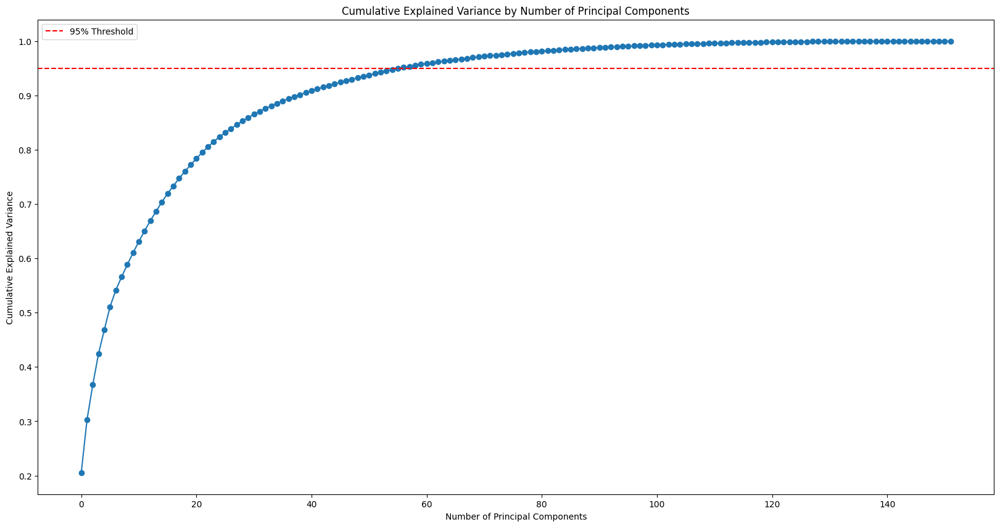

57


In [10]:
# Dropping any non-numeric columns + asthma_prevalence (since that's what we're trying to predict)
unsupervised_df = final_combined_df.drop(columns=['Region', 'stateabbr', 'statedesc', 'countyname', 'FIPS', 'asthma_prevalence'])

#Using Standard Scaler to standardize the dataset
scaler = StandardScaler()
scaled = scaler.fit_transform(unsupervised_df)

# Running PCA
pca = PCA()
x_pca = pca.fit_transform(scaled)

# Explained variance ratio
# Plotting the cumulative explained variance by number of principal components
plt.figure(figsize=(20,10))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.axhline(y=0.95, label='95% Threshold', color='red', linestyle='--')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Number of Principal Components')
plt.legend(loc='upper left')
plt.show()

# Keeping only the first n principal components that represent 95% of the variance
threshold = 0.95
cumulative = np.cumsum(pca.explained_variance_ratio_)
n = np.where(cumulative >= threshold)[0][0] + 1
print(n)
x_pca = x_pca[:,:n]

We first used standard scaler to normalize all features and set up our data for PCA. Then, we ran PCA to reduce dimensionality, and we've kept the top 57 components that represent 95% of the variance. 

### K-Means Clustering

In [11]:
# Running K-Means Clustering with different values of K and using Silhouette Score to find the optimal number of clusters
# This may take a few minutes to run
k = range(2,10)
scores = []
for i in k:
    # using random_state=42 for consistency
    kmeans = KMeans(n_clusters=i,random_state=42)
    res = kmeans.fit_predict(x_pca)
    score = silhouette_score(x_pca,res)
    scores.append(score)
    print(i,score)
best_silhouette = max(scores)

2 0.22712927357885085
3 0.10087836806705562
4 0.11367971192924088
5 0.0957503798725186
6 0.08243862703387249
7 0.08652506595245539
8 0.05799039982234971
9 0.06002464092413794


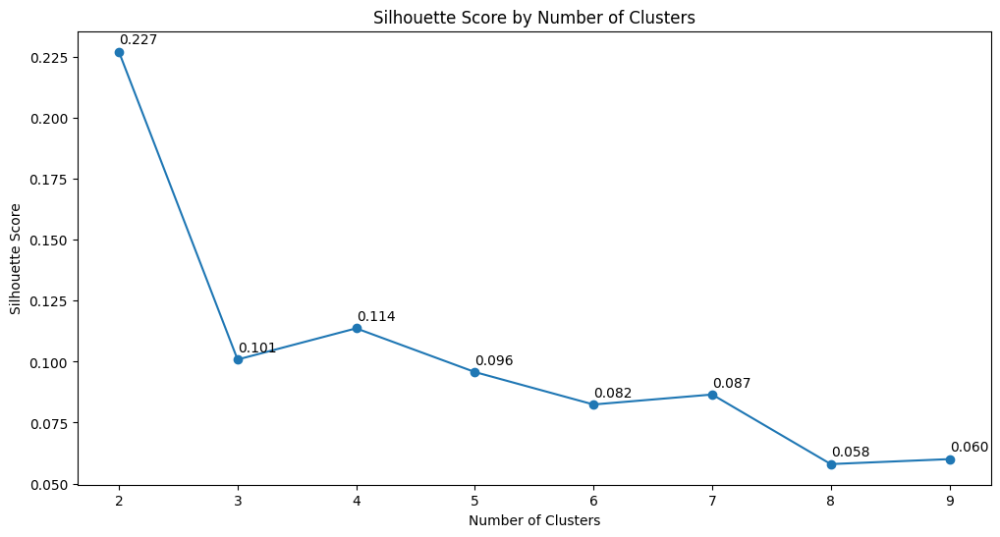

In [12]:
# Visualizing the Silhouette Scores
plt.figure(figsize=(12,6))
plt.plot(k,scores, 'o-')
plt.title('Silhouette Score by Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
# Labeling the points
k = range(2,10)
for i,score in zip(k,scores):
    plt.text(i+0.001,score+0.0032, f"{score:.3f}")
plt.show()

Based off of silhouette scores, the ideal number of clusters is either 2 with a score of 0.227, or 4 with a score of 0.114.

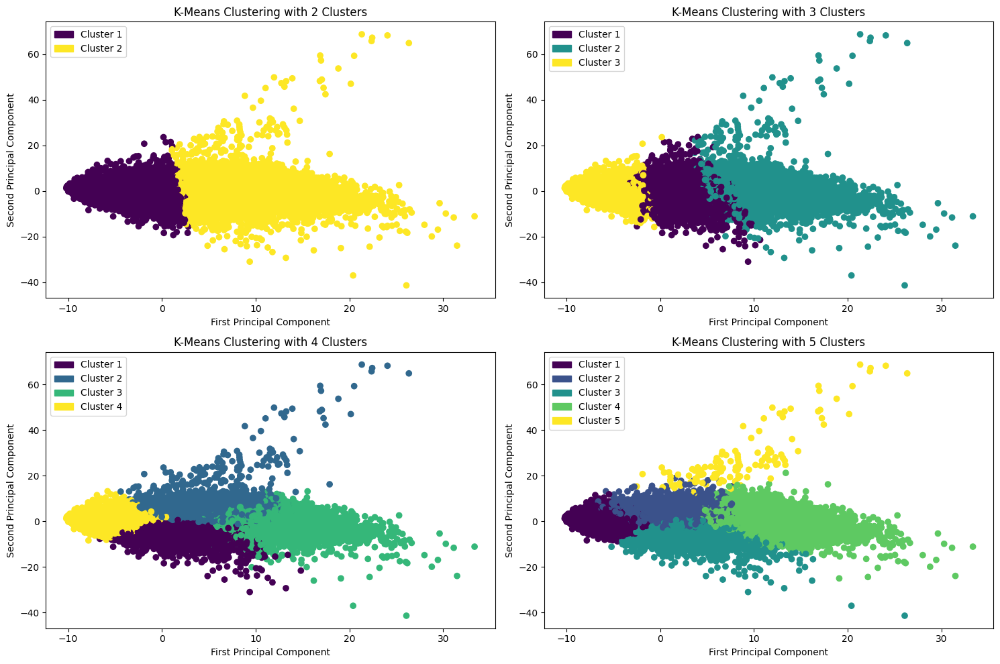

In [13]:
# Plotting the clusters in a 2D space (based on the first two PCA components)
plt.figure(figsize=(15,10))
for i,j in enumerate(range(2,6)):
    kmeans = KMeans(n_clusters=j, random_state=42)
    res = kmeans.fit_predict(x_pca)
    plt.subplot(2,2,i+1)
    plt.scatter(x_pca[:,0],x_pca[:,1], c=res)
    plt.title(f'K-Means Clustering with {j} Clusters')
    plt.xlabel('First Principal Component')
    plt.ylabel('Second Principal Component')
    # Adding a legend for each cluster (i+1 to account for zero indexing)
    labels = [f'Cluster {i+1}' for i in range(j)]
    colors = plt.cm.get_cmap('viridis', j)
    color_labels =[matplotlib.patches.Patch(color=colors(i),label=labels[i]) for i in range(j)]
    plt.legend(handles=color_labels, loc='upper left')
plt.tight_layout()
plt.show()

Looking at these visuals, we can see that choosing 4 clusters provides the best balance between capturing complexity and having adequate separation between the clusters. Despite the silhouette score being a bit lower, the 4 cluster solution will allow us to discover deeper patterns that would be missed with a 2 way split. 

,count,mean,std,min,25%,50%,75%,max
Cluster,,,,,,,,
0,15898.0,0.102831,0.012744,0.057,0.094,0.102,0.111,0.156
1,14144.0,0.118509,0.015735,0.063,0.108,0.118,0.128,0.207
2,6581.0,0.108544,0.016419,0.061,0.096,0.106,0.119,0.182
3,30745.0,0.103087,0.011211,0.050,0.095,0.103,0.111,0.150


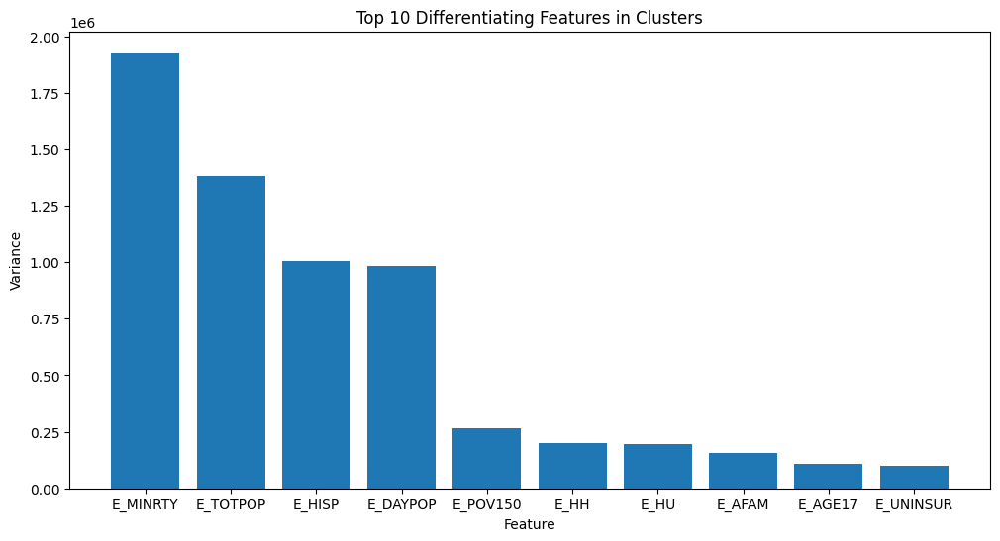

In [14]:
# Running the final k-means clustering with 4 clusters + adding the cluster labels to the original dataframe
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans_result = kmeans.fit_predict(x_pca)
final_combined_df['Cluster'] = kmeans_result

# Getting the summary statistics of the clusters for asthma prevalence
clustering_asthma =final_combined_df.groupby('Cluster')['asthma_prevalence'].describe()
display(clustering_asthma)

# Looking at the top 10 most differing features for each cluster
# getting the means, then finding the ones with most variance between the 4 clusters
most_var = final_combined_df.groupby('Cluster').mean(numeric_only=True).var()
top10 = most_var.sort_values(ascending=False).head(10)
# Plotting the top 10 most differing features
plt.figure(figsize=(12,6))
plt.bar(top10.index, top10.values)
plt.xlabel('Feature')
plt.ylabel('Variance')
plt.title('Top 10 Differentiating Features in Clusters')
plt.show()

From the table, we can see that the highest average asthma prevalence is in cluster 1 (11.85%), and the lowest prevalence is in cluster 0 (10.28%). To better understand how the 4 clusters differ, we visualized which features had the highest variance between clusters. The top two were E_MINRTY: Estimated Minority Population and E_TOTPOP: Estimated Total Population. This suggests the population and demographic composition are the key factors the separate the clusters.

### Community Detection

In [15]:
# Using Louvain Community Detection
# First finding the ideal parameters that give us the best modularity score (may take a bit to run)
num_neighbors = [10,11,12,15,20]
resolutions = [0.8,0.9,1]
results = []
for i in num_neighbors:
    # Making a graph using our PCA results
    matrix = kneighbors_graph(x_pca, i,include_self=False)
    graph = nx.from_scipy_sparse_array(matrix)
    for j in resolutions:
        #Running Louvain community detection (using seed to control randomness)
        comm = nx.community.louvain_communities(graph,seed=42, resolution=j)
        mod = modularity(graph,comm)
        results.append({'n': i, 'res':j,'mod':mod})
# Displaying the table to see the ideal parameters
best_comm_params = pd.DataFrame(results)
best_comm_params = best_comm_params.pivot(index='n',columns='res', values='mod')
display(best_comm_params)

res,0.8,0.9,1.0
n,,,
10,0.746576,0.746954,0.748160
11,0.739620,0.742975,0.744729
12,0.740189,0.743227,0.742283
15,0.734045,0.734631,0.734979
20,0.716588,0.719096,0.721468


We can see that the optimal parameters are to use 10 numbers of neighbors when creating the graph, and a resolution of 1.0 when running the Louvain communities algorithm.

In [16]:
# Running Louvain community detection with the best parameters we found (n=10, resolution=1.0)
matrix = kneighbors_graph(x_pca, 10,include_self=False)
graph = nx.from_scipy_sparse_array(matrix)
comm = nx.community.louvain_communities(graph, seed=42, resolution=1.0)
mod_score = modularity(graph,comm)
print(mod_score)

# Adding the community labels to the original dataframe
for i,j in enumerate(comm):
    for k in j:
        final_combined_df.loc[k,'Community'] = i

0.7481597865821419


The modularity score is 0.748. Let's visualize the communities in 2D using our PCA results. 

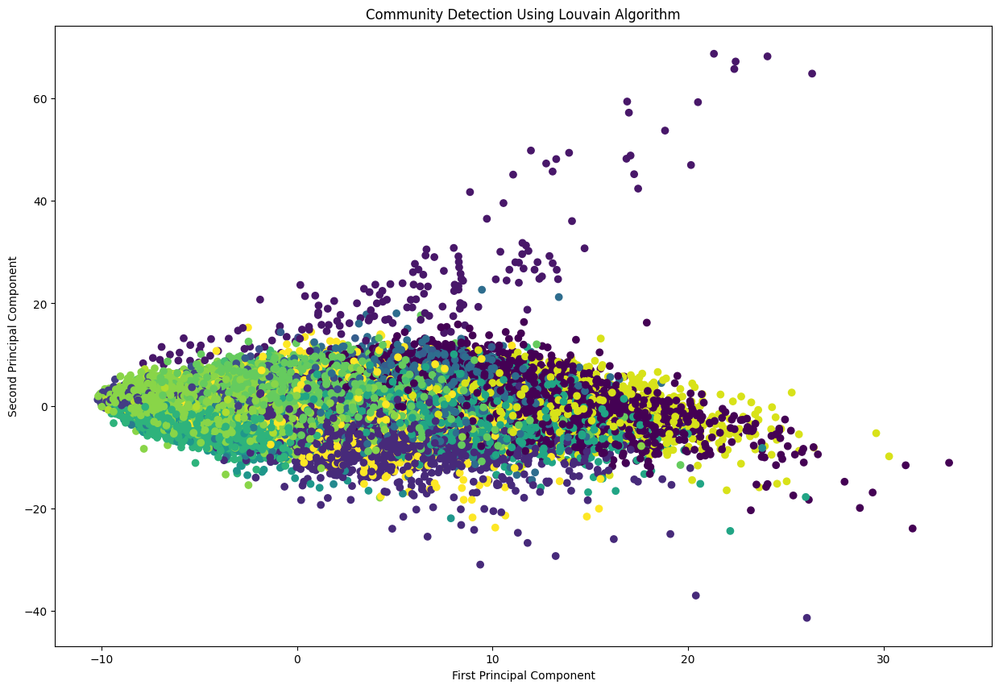

In [17]:
# Generating a plot using our PCA results for the communities
plt.figure(figsize=(15,10))
plt.scatter(x_pca[:,0],x_pca[:,1], c=final_combined_df['Community'])
plt.title('Community Detection Using Louvain Algorithm')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.show()

This visual shows the communities within a 2D space using results from PCA. Unlike K-Means Clustering which relies on spacial distance, community detection algorithms (we used Louvain) creates communities based on graph connectivity. This is why some communities seem to be so intermixed when graphed on a 2D space, despite there being substantial differences between them. Let's look at a asthma prevalence between the different communities and again graph the top 10 most differing features.

,count,mean,std,min,25%,50%,75%,max
Community,,,,,,,,
0.0,3861.0,0.125978,0.016357,0.063,0.11400,0.1250,0.137,0.207
1.0,162.0,0.107438,0.022190,0.067,0.09000,0.1045,0.120,0.171
2.0,7620.0,0.106307,0.012683,0.066,0.09700,0.1050,0.115,0.164
3.0,2224.0,0.100638,0.009895,0.074,0.09400,0.1010,0.107,0.137
4.0,2336.0,0.106890,0.011167,0.074,0.09900,0.1060,0.114,0.148
5.0,981.0,0.125685,0.015339,0.085,0.11600,0.1250,0.134,0.189
6.0,4933.0,0.118827,0.014975,0.077,0.10800,0.1190,0.129,0.189
7.0,438.0,0.099932,0.011783,0.066,0.09225,0.1000,0.108,0.140
8.0,831.0,0.111782,0.011941,0.070,0.10400,0.1110,0.119,0.150


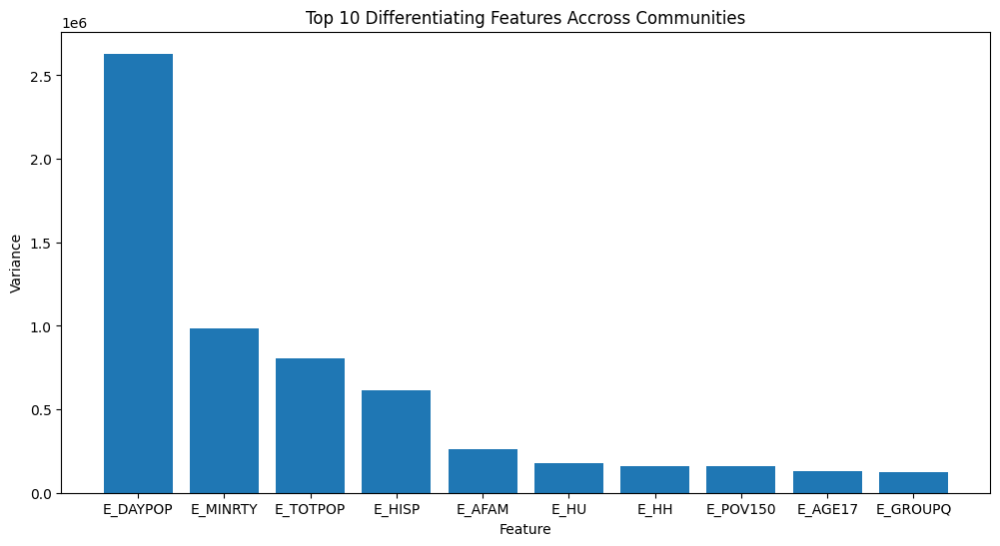

In [18]:
# Getting the summary statistics of the communities for asthma prevalence
comm_asthma =final_combined_df.groupby('Community')['asthma_prevalence'].describe()
display(comm_asthma)

# Looking at the top 10 most differing features for each communitity
# getting the means, then finding the ones with most variance
most_var_community = final_combined_df.groupby('Community').mean(numeric_only=True).var()
top10_comm = most_var_community.sort_values(ascending=False).head(10)
# Plotting the top 10 most differing features
plt.figure(figsize=(12,6))
plt.bar(top10_comm.index, top10_comm.values)
plt.xlabel('Feature')
plt.ylabel('Variance')
plt.title('Top 10 Differentiating Features Accross Communities')
plt.show()

Community detection using the Louvain algorithm formed 18 communities. Community 0 had the highest average asthma prevalence (12.60%), while community 9 had the lowest asthma prevalence (9.81%). The top two differentiating features across the communities were E_DAYPOP: Estimated Daytime Population and E_MINRTY: Estimated Minority Population. This suggests the daytime population and demographic composition are the key factors the separate the communities.

## Supervised Learning Algorithms

### Baseline Models Comparison

Unsupervised learning algorithms above helped us for dimensionality reduction and to generate additional features. However, depending on the structure of the original data, techniques like PCA can also lead to information loss, which may negatively impact model performance.

To evaluate the most effective feature sets, we established baseline supervised models using the following three approaches:

        1. Raw features only
        2. PCA transformed features
        3. Raw features combined with outputs from K-Means clustering and community detection

For each approach, we trained two baseline models:
        - a baseline linear regression model 
        - a baseline random forest regressor
        
Fomr there,we comapre their performance using Mean Squared Error (MSE) and R² score.


First, we start with the raw features only.
For the Linear Regression model, no regularization was applied, as we observed no significant improvement in performance when using L1, L2, or Elastic Net regularization during our exploration.

In [19]:
# Training Baseline Linear Regression and Random Forest Models with Raw Features

# Defining features and target
X = final_combined_df.drop(columns=['asthma_prevalence', 'Region', 'stateabbr', 'statedesc', 'countyname', 'FIPS', 'Cluster', 'Community'])
y = final_combined_df['asthma_prevalence']

# Train and Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardizing the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Training and evaluating a baseline Linear Regression model
lr_model = LinearRegression()
lr_model.fit(X_train_scaled, y_train)

lr_pred = lr_model.predict(X_test_scaled)

lr_mse = mean_squared_error(y_test, lr_pred)
lr_r2 = r2_score(y_test, lr_pred)

print("Linear Regression with Original Features:")
print(f"Mean Squared Error: {lr_mse}")
print(f"R-squared: {lr_r2}")

# Training and evaluating a baseline Linear Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train_scaled, y_train)

rf_pred = rf_model.predict(X_test_scaled)

rf_mse = mean_squared_error(y_test, rf_pred)
rf_r2 = r2_score(y_test, rf_pred)

print("\nRandom Forest with Original Features:")
print(f"Mean Squared Error: {rf_mse}")
print(f"R-squared: {rf_r2}")

Linear Regression with Original Features:
Mean Squared Error: 5.990820823503289e-05
R-squared: 0.7208651553486651

Random Forest with Original Features:
Mean Squared Error: 4.7400918702686666e-05
R-squared: 0.7791413152185099


The baseline models with raw features performed decently with a R² score of 0.72 for the linear regression model, and a R² score of 0.78 for the random forest model.

Next, we will build the baseline models with the PCA transformed features only.

In [20]:
# Training Baseline Linear Regression and Random Forest Models with PCA Components

# Using the PCA components we calculated earlier - x_pca
# N number of components that explain 95% of variance
X = x_pca
y = final_combined_df['asthma_prevalence']

# Train and Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Training and evaluating a Linear Regression model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
lr_pred = lr_model.predict(X_test)
lr_mse = mean_squared_error(y_test, lr_pred)
lr_r2 = r2_score(y_test, lr_pred)

print("Linear Regression with PCA Components:")
print(f"Mean Squared Error: {lr_mse}")
print(f"R-squared: {lr_r2}")

# Training and evaluating a Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
rf_pred = rf_model.predict(X_test)
rf_mse = mean_squared_error(y_test, rf_pred)
rf_r2 = r2_score(y_test, rf_pred)

print("\nRandom Forest with PCA Components:")
print(f"Mean Squared Error: {rf_mse}")
print(f"R-squared: {rf_r2}")

Linear Regression with PCA Components:
Mean Squared Error: 7.244714847823725e-05
R-squared: 0.6624415229284173

Random Forest with PCA Components:
Mean Squared Error: 7.115481085052696e-05
R-squared: 0.6684630093586699


While PCA did help with the dimensionality reduction, it did not improve the model performance.
Instead, we are observing a significant drop in the performance of both the linear regression and random forest models when using the PCA transformed features.

Next, we will explore the option of combining the original features with the clustering results.

In [21]:
# Training Models with Original Features +  the 'Cluster' and 'Community' features generated by unsupervised learning

# Using the original features
X = final_combined_df.drop(columns=['asthma_prevalence', 'Region', 'stateabbr', 'statedesc', 'countyname', 'FIPS'])

# Target variable
y = final_combined_df['asthma_prevalence']

# Train and Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardizing the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Training and evaluating a Linear Regression model
lr_model = LinearRegression()
lr_model.fit(X_train_scaled, y_train)
lr_pred = lr_model.predict(X_test_scaled)
lr_mse = mean_squared_error(y_test, lr_pred)
lr_r2 = r2_score(y_test, lr_pred)

print("Linear Regression with Original Features + Clustering Outcomes:")
print(f"Mean Squared Error: {lr_mse}")
print(f"R-squared: {lr_r2}")

# Training and evaluating a Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train_scaled, y_train)
rf_pred = rf_model.predict(X_test_scaled)
rf_mse = mean_squared_error(y_test, rf_pred)
rf_r2 = r2_score(y_test, rf_pred)

print("\nRandom Forest with Original Features + Clustering Outcomes:")
print(f"Mean Squared Error: {rf_mse}")
print(f"R-squared: {rf_r2}")

Linear Regression with Original Features + Clustering Outcomes:
Mean Squared Error: 5.9832375550621375e-05
R-squared: 0.7212184883093115

Random Forest with Original Features + Clustering Outcomes:
Mean Squared Error: 4.7364561184503505e-05
R-squared: 0.7793107185521925


### Gradient Boosting Regression Model

With the combination of the original features and clustering results, we did not observe any major changes in model performance. However, the random forest model's feature importances hinted that some of the community features could provide some insights. Therefore, we will continue with the option of using the original features along with the clustering outputs.

Another key finding from reviewing the baseline models is that the random forest models generally performed much better than the linear regression models, regardless of the input features used. This suggests that the original dataset might contain complex nonlinear relationships, making nonlinear models a better choice in this case.

For this reason, Gradient Boosting Regression will be used to help improve model performance. Alongside this, we will perform feature selection and cross-validation to further enhance performance and increase robustness.

Cross validation scores: [0.79484219 0.80726659 0.80739812 0.79979535 0.79934947]

Gradient Boosting Results:
Mean Squared Error: 4.229610417274238e-05
R-squared: 0.802926563563771

Important features:
['E_POV150', 'M_LIMENG', 'EP_POV150', 'EP_NOHSDP', 'EP_AGE65', 'EP_DISABL', 'EPL_POV150', 'EPL_NOHSDP', 'EPL_AGE65', 'EPL_DISABL', 'M_NHPI', 'EP_AFAM', 'EP_HISP', 'EP_ASIAN', 'EP_AIAN', 'EP_TWOMORE', 'ds_pm_pred', 'ds_pm_stdd', 'Community']


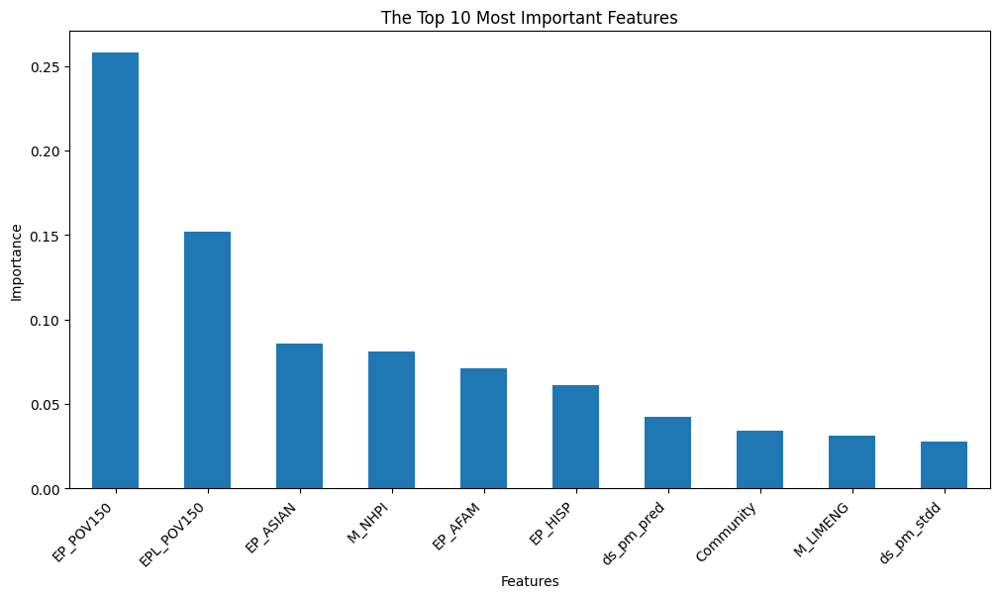

In [22]:
# Gradient Boosting Regression Model using Original Features + Clustering outcomes, with feature selection and cross-validation

# Using original features along with clustering results
X = final_combined_df.drop(columns=['asthma_prevalence', 'Region', 'stateabbr', 'statedesc', 'countyname', 'FIPS'])
y = final_combined_df['asthma_prevalence']

# Train and Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Gradient Boosting Regression pipeline
# No need to further process the 'Cluster' and 'Community' features, as they are already encoded and no standardization is required
orginal_features = [col for col in X.columns if col not in ['Cluster', 'Community']]

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), orginal_features),
        ('passthrough', 'passthrough', ['Cluster', 'Community'])
    ]
)

gb_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectFromModel(GradientBoostingRegressor(random_state=42))),
    ('regressor', GradientBoostingRegressor(
        n_estimators=200,
        max_depth=5,
        random_state=42,
        max_features=0.5 # use 50% of features to avoid overfitting, especially due to high weight of poverty features

    ))
])

# Perform K Fold cross validation
kfold = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(gb_pipeline, X_train, y_train, cv=kfold, scoring='r2')

print("Cross validation scores:", cv_scores)

# Train and evaluate the final model
gb_pipeline.fit(X_train, y_train)
gb_pred = gb_pipeline.predict(X_test)
gb_mse = mean_squared_error(y_test, gb_pred)
gb_r2 = r2_score(y_test, gb_pred)

print("\nGradient Boosting Results:")
print(f"Mean Squared Error: {gb_mse}")
print(f"R-squared: {gb_r2}")

# Feautre Importance Summary
all_feature_names = X.columns 

feature_selector = gb_pipeline.named_steps['feature_selection']
selected_features_mask = feature_selector.get_support()
selected_features = np.array(all_feature_names)[selected_features_mask].tolist()

print("\nImportant features:")
print(selected_features)

# Plotting feature importances
importances = gb_pipeline.named_steps['regressor'].feature_importances_
feature_imp = pd.Series(importances, index=selected_features).sort_values(ascending=False)

plt.figure(figsize=(12, 6))
feature_imp[:10].plot(kind='bar')
plt.title('The Top 10 Most Important Features')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(rotation=45, ha='right')
plt.show()

We can see the Gradient Boosting Regression model above was able to make a relatively good prediction.

Also from the feature importances selection, we notice that the 'Percentile percentage of persons below 150% poverty' and the 'Percentage of persons below 150% poverty' are the two factors that correlate with the 'Prevalence of Asthma' the most. 

However, there are a couple of major issues here:

        1. Multicollinearity - The "Percentile percentage of persons below 150% poverty" and the "Percentage of persons below 150% poverty" are the two most important features, and they are highly correlated with each other. This issue also applies to many other features.

        2. 
        - Many of the features heavily used by the model focus on racial groups. For example, "EP_ASIAN" measures the "Percentage of Asian, not Hispanic or Latino persons estimate," according to the CDC/ATSDR SVI 2022 Documentation. These features are likely not reliable and may increase inaccuracies and reinforce social biases.

To address these issues, we will remove all race related features as well as eliminate duolicate features that are highly correlated with others. We will also replace the Gradient Boosting Regression model with an XGBoost Regression model to optimize performance and enable the use of regularization techniques such as Ridge.

### XGBoost Regression Model

Like mentioned above, first we will preprocess the data to remove all race related features and drop highly correlated features.



In [23]:
# Dropping Racial Features and Highly Correlated Features

# Dropping racial features
columns_to_drop = [
    'EP_AFAM', 'MP_AFAM', 'EP_HISP', 'MP_HISP', 'EP_ASIAN', 'MP_ASIAN',
    'EP_AIAN', 'MP_AIAN', 'EP_NHPI', 'MP_NHPI', 'EP_TWOMORE', 'MP_TWOMORE',
    'EP_OTHERRACE', 'MP_OTHERRACE', 'E_AFAM', 'M_AFAM', 'E_HISP', 'M_HISP',
    'E_ASIAN', 'M_ASIAN', 'E_AIAN', 'M_AIAN', 'E_NHPI', 'M_NHPI', 'E_TWOMORE',
    'M_TWOMORE', 'E_OTHERRACE', 'M_OTHERRACE', 'E_MINRTY', 'M_MINRTY', 'EP_MINRTY',
    'MP_MINRTY', 'F_MINRTY', 'SPL_THEME3', 'RPL_THEME3', 'F_THEME3', 

]

final_combined_df_non_racial = final_combined_df.drop(columns=columns_to_drop)


X = final_combined_df_non_racial.drop(columns=['asthma_prevalence', 'Region', 'stateabbr', 'statedesc', 'countyname', 'FIPS'])
y = final_combined_df_non_racial['asthma_prevalence']

# Dropping Highly Correlated Features
corr_matrix = X.corr().abs()
upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
features_to_drop = [column for column in upper_triangle.columns if any(upper_triangle[column] > 0.94)]

#print("Highly correlated features to be dropped:")
#print(features_to_drop)

X = X.drop(columns=features_to_drop)

# Train and Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


After dropping the racial features and highly correlated features, we will build an XGBoost Regression model with L2 Regularization this time. 

But first, we need to find the optimal learning rate and number of estimators for the XGBoost model. This will help achieve the best performance while avoiding overfitting. To do so, we will examine the learning curves to see how these parameters affect the RMSE error, and select the optimal values where the RMSE stabilizes and stops decreasing.

(For reg_lambda and colsample_bytree parameters, grid search shows higher values can lead to better accuracy, however, we will set both of them to 0.5 to ensure the generalization of the model.)

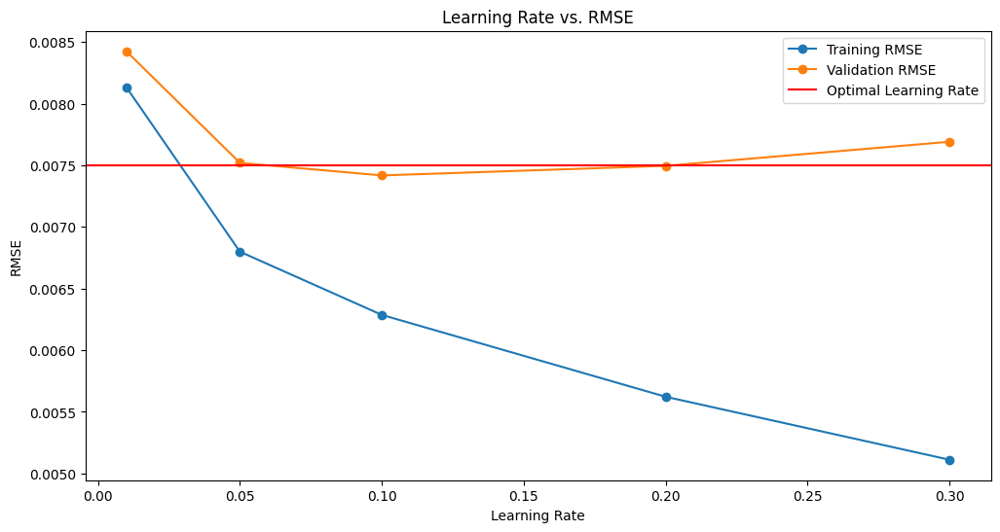

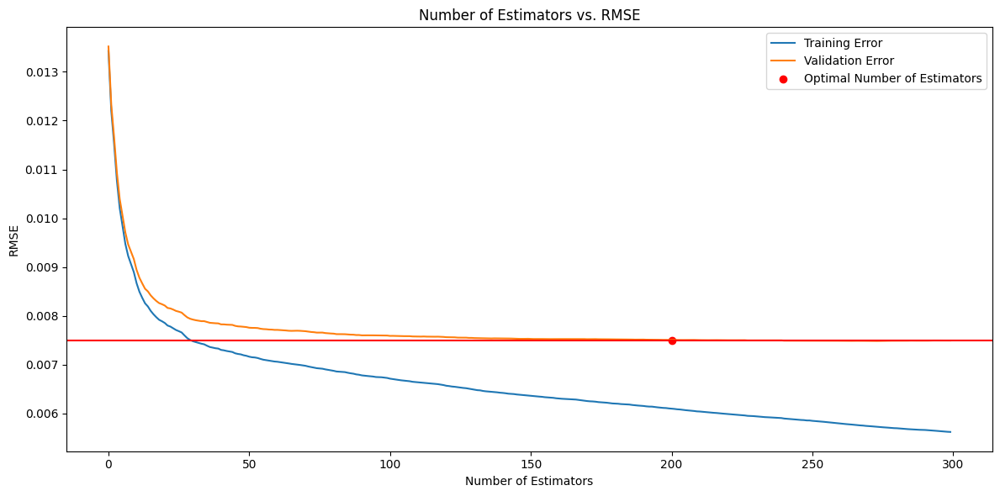

In [24]:
# XGBoost Regression Model to find the optimal learning rate and number of estimators

# XGBoost Regression pipeline
# No need to further process the 'Cluster' and 'Community' features
orginal_features = [col for col in X.columns if col not in ['Cluster', 'Community']]

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), orginal_features),
        ('passthrough', 'passthrough', ['Cluster', 'Community'])
    ]
)

X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)

# Feature selection
feature_selector = SelectFromModel(XGBRegressor(random_state=42))
X_train_selected = feature_selector.fit_transform(X_train_processed, y_train)
X_test_selected = feature_selector.transform(X_test_processed)

# Test different learning rates
learning_rates = [0.01, 0.05, 0.1, 0.2, 0.3]
train_scores = []
val_scores = []

plt.figure(figsize=(12, 6))
for lr in learning_rates:
    xgb_model = XGBRegressor(
        n_estimators=300,
        random_state=42,
        reg_lambda=0.5, # Grid search shows higher the lambda, the model performs the better, however, we will keep it at 0.5 to increase generalization
        colsample_bytree=0.5, # Reduce to 0.5 to increase generalization and avoid overfitting like L2 regularization
        learning_rate=lr,
        eval_metric='rmse'
    )
    
    # Train model with evaluation set
    eval_set = [(X_train_selected, y_train), (X_test_selected, y_test)]
    xgb_model.fit(
        X_train_selected, 
        y_train,
        eval_set=eval_set,
        verbose=False
    )
    
    # Get evaluation results
    results = xgb_model.evals_result()
    train_scores.append(results['validation_0']['rmse'][-1])
    val_scores.append(results['validation_1']['rmse'][-1])

# Plot learning curves
plt.plot(learning_rates, train_scores, 'o-', label='Training RMSE')
plt.plot(learning_rates, val_scores, 'o-', label='Validation RMSE')
plt.title('Learning Rate vs. RMSE')
plt.xlabel('Learning Rate')
plt.ylabel('RMSE')
plt.ylabel('RMSE')
plt.axhline(y=0.0075, color='r', linestyle='-', label='Optimal Learning Rate')
plt.legend()
plt.grid(False)
plt.show()

# Find optimal number of estimators
xgb_model = XGBRegressor(
    n_estimators=300,
    random_state=42,
    reg_lambda=0.5, 
    colsample_bytree=0.5,
    learning_rate=0.2, # Through grid search, we found that the best learning rate is 0.2
    eval_metric='rmse'  # Move eval_metric to model initialization
)

train_errors = []
val_errors = []
eval_set = [(X_train_selected, y_train), (X_test_selected, y_test)]

# Train model with evaluation set
xgb_model.fit(
    X_train_selected, 
    y_train,
    eval_set=eval_set,
    verbose=False
)

# Get evaluation results
results = xgb_model.evals_result()

# Plot learning curves
plt.figure(figsize=(12, 6))
plt.plot(results['validation_0']['rmse'], label='Training Error')
plt.plot(results['validation_1']['rmse'], label='Validation Error')
plt.title('Number of Estimators vs. RMSE')
plt.xlabel('Number of Estimators')
plt.ylabel('RMSE')
plt.axhline(y=0.0075, color='r', linestyle='-')
plt.scatter(200, 0.0075, color='r', label='Optimal Number of Estimators')
plt.legend()
plt.grid(False)
plt.tight_layout()
plt.show()

Through the above learning curves, we can see that the optimal number of estimators is 200 and the optimal learning rate is 0.2. Therefore, we will use these parameters to train our final XGBoost model.

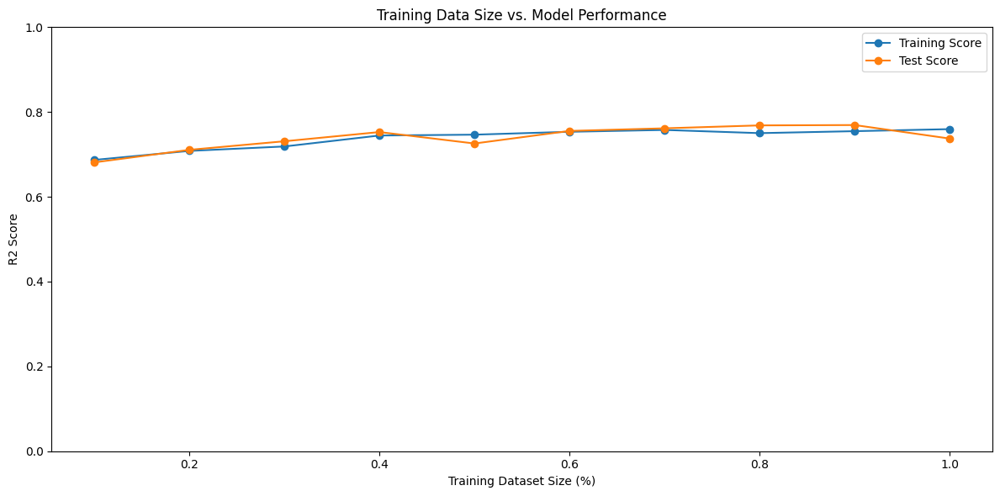


Final Model Metrics:
Mean Squared Error: 5.6369647915533544e-05
R2 Score: 0.7373526370172493
Cross Validation Scores: [0.7640502  0.76063003 0.74972681 0.77383204 0.7780773  0.76463783
 0.76765298 0.7714936  0.73394335 0.73166356]


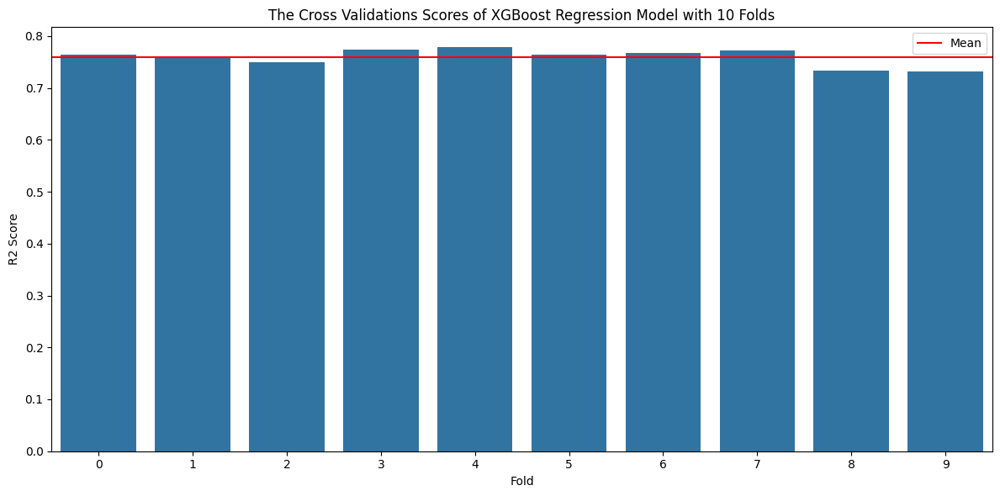

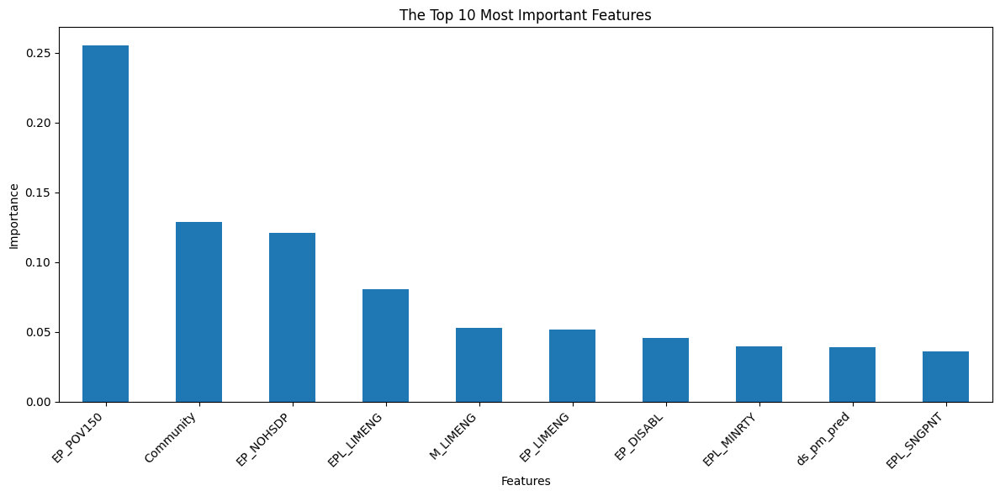

In [25]:
# XGBoost model using the optimal number of estimators and learning rate, with L2 Regularization
xgb_model = XGBRegressor(
    n_estimators=200, # Optimal Number of Estimators from the above analysis
    random_state=42,
    reg_lambda=0.5,
    colsample_bytree=0.5,
    learning_rate=0.2, # Optimal Learning Rate from the above analysis
    eval_metric='rmse'
)

# Create XGBoost pipeline
xgb_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', feature_selector),
    ('regressor', xgb_model)
])

# Measure Model Perofmance along with Training Data Size
# Create arrays to store training sizes and scores
train_sizes = np.linspace(0.1, 1.0, 10)
train_scores = []
test_scores = []

# For each training size
for size in train_sizes:
    n_train = int(len(X_train) * size)
    
    X_train_subset = X_train[:n_train]
    y_train_subset = y_train[:n_train]
    
    # Perform cross validation
    kfold = KFold(n_splits=10, shuffle=True, random_state=42)
    train_cv_scores = cross_val_score(xgb_pipeline, X_train_subset, y_train_subset, 
                                    cv=kfold, scoring='r2')
    
    train_scores.append(np.mean(train_cv_scores))
    
    # Fit and evaluate the model
    xgb_pipeline.fit(X_train_subset, y_train_subset)
    test_score = r2_score(y_test, xgb_pipeline.predict(X_test))
    test_scores.append(test_score)

# Plot learning curves
plt.figure(figsize=(12, 6))
plt.plot(train_sizes, train_scores, 'o-', label='Training Score')
plt.plot(train_sizes, test_scores, 'o-', label='Test Score')
plt.title('Training Data Size vs. Model Performance')
plt.xlabel('Training Dataset Size (%)')
plt.ylim(0, 1.0)
plt.ylabel('R2 Score')
plt.grid(False)
plt.legend()
plt.tight_layout()
plt.show()

xgb_pred = xgb_model.predict(X_test_selected)
final_r2 = r2_score(y_test, xgb_pred)
final_mse = mean_squared_error(y_test, xgb_pred)

print(f"\nFinal Model Metrics:")
print(f"Mean Squared Error: {final_mse}")
print(f"R2 Score: {final_r2}")
print(f"Cross Validation Scores: {train_cv_scores}")



# Plot the cross validation scores
plt.figure(figsize=(12, 6))
sns.barplot(x=np.arange(0,10,1), y=train_cv_scores)
plt.title('The Cross Validations Scores of XGBoost Regression Model with 10 Folds')
plt.xlabel('Fold')
plt.ylabel('R2 Score')
plt.axhline(y=train_cv_scores.mean(), color='r', linestyle='-', label='Mean')
plt.legend()
plt.tight_layout()
plt.show()


# Feature Importance Summary
selected_features_mask = feature_selector.get_support()
selected_features = np.array(X.columns)[selected_features_mask].tolist()

importances = xgb_model.feature_importances_
feature_imp = pd.Series(importances, index=selected_features).sort_values(ascending=False)

plt.figure(figsize=(12, 6))
feature_imp[:10].plot(kind='bar')
plt.title('The Top 10 Most Important Features')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

The top three most important features from the XGBoost regression model are 'EP_POV150', 'EP_NOHSDP', and 'Community'. Esepcailly, 'EP_POV150' continues to carry significant weight even after applying L2 regularization and setting 'colsample_bytree' to 0.5. This suggests the existance of a strong correlation between poverty and asthma prevalence in a region.

Our final XGBoost regression model achieved a relatively good prediction performance (R2 score: 0.74) using the selected features and regularization techniques. The model also performed consistently across different training data sizes. Combined with the cross-validation scores of [0.7640502, 0.76063003, 0.74972681, 0.77383204, 0.7780773, 0.76463783, 0.76765298, 0.7714936, 0.73394335, 0.73166356] across 10 folds, we can reasonably conclude that the model is stable and generalizes well to unseen data.

Following graphs provde addtional insights into the model's performance and predictions:

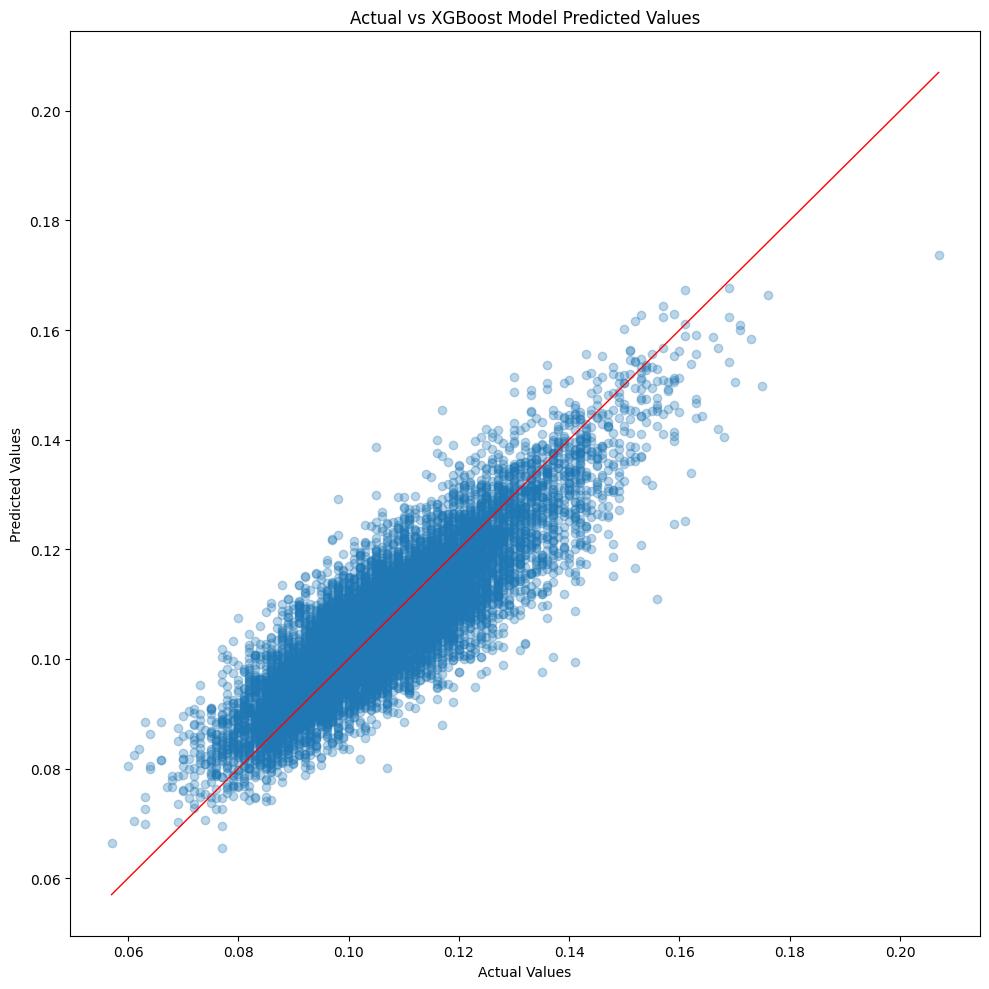

In [26]:
# Actual vs XGBoost Model Predicted Values
plt.figure(figsize=(10, 10))
plt.scatter(y_test, xgb_pred, alpha=0.3)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r-', lw=1)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs XGBoost Model Predicted Values')
plt.tight_layout()
plt.show()

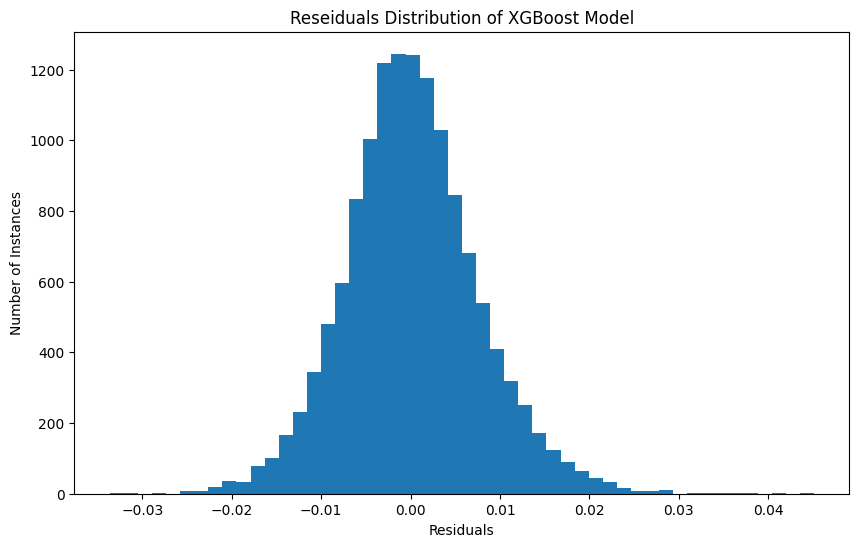

In [27]:
# Distribution of Residuals

residuals = y_test - xgb_pred

plt.figure(figsize=(10, 6))
plt.hist(residuals,bins=50)
plt.xlabel('Residuals')
plt.ylabel('Number of Instances')
plt.title('Reseiduals Distribution of XGBoost Model')
plt.show()

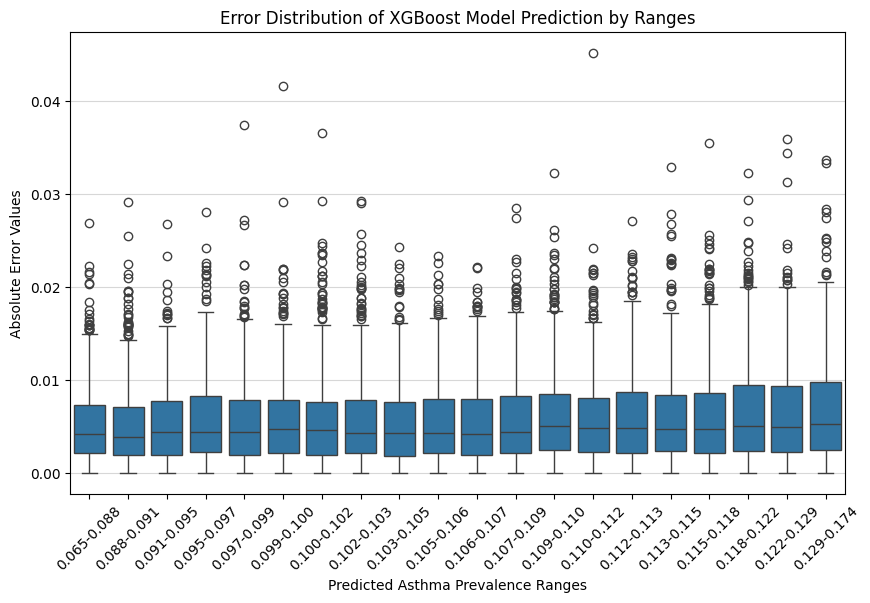

In [28]:
# Error by Prediction Range

xgb_pred_ranges = pd.qcut(xgb_pred, q=20)
range_labels = [f"{i.left:.3f}-{i.right:.3f}" for i in xgb_pred_ranges.categories]
xgb_pred_ranges_labeled = pd.qcut(xgb_pred, q=20, labels=range_labels)

error_by_ranges = pd.DataFrame({
    'Prediction_Range': xgb_pred_ranges_labeled,
    'Absolute_Error': np.abs(residuals)
})
plt.figure(figsize=(10, 6))
sns.boxplot(x='Prediction_Range', y='Absolute_Error', data=error_by_ranges)
plt.xticks(rotation=45)
plt.grid(True, alpha=0.5, axis='y')
plt.xlabel('Predicted Asthma Prevalence Ranges')
plt.ylabel('Absolute Error Values')
plt.title('Error Distribution of XGBoost Model Prediction by Ranges')
plt.show()

## Visualizations

### Asthma Prevalence Distribution

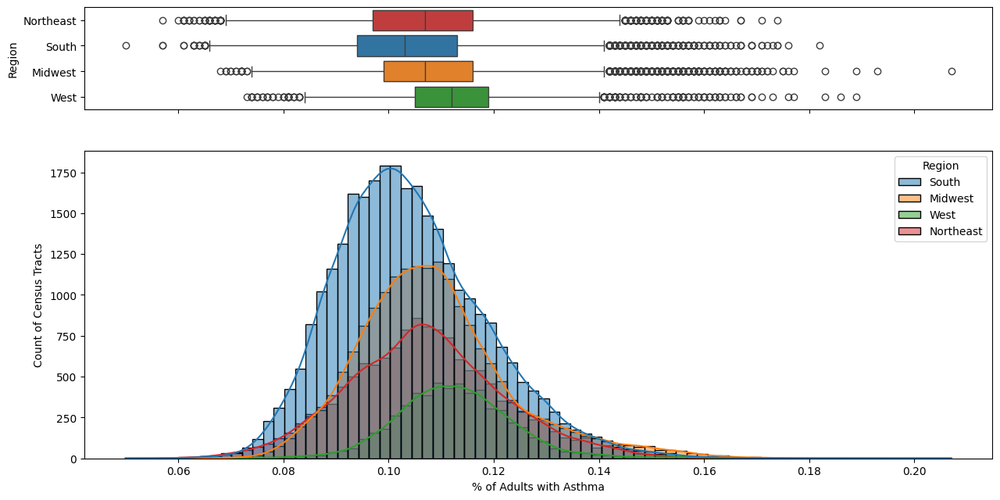

In [29]:
# Corrected code to show the distribution of asthma prevalence at the census tract-level by region
order_list = ['Northeast', 'South', 'Midwest', 'West']

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.25, .75)}, figsize=(15,7.5))

# Histogram plot with seaborn
sns.histplot(data=final_combined_df, x="asthma_prevalence", hue="Region", kde=True, ax=ax_hist, binwidth=0.002)

# Boxplot for display
sns.boxplot(x="asthma_prevalence", y="Region", hue="Region", data=final_combined_df, ax=ax_box, order=order_list)

# Customizing patch colors and handles for the boxplot
for i, patch in enumerate(ax_box.artists):
    col = patch.get_facecolor()
    patch.set_edgecolor(col)
    patch.set_facecolor('None')

    for j in range(i * 6, i * 6 + 6):
        line = ax_box.lines[j]
        line.set_color(col)
        line.set_mfc(col)
        line.set_mec(col)

# Adding labels
plt.xlabel('% of Adults with Asthma')
plt.ylabel('Count of Census Tracts')

# Show the plot
plt.show()

## Choropleth Maps Based on Model Predictions

In [30]:
# Apply XGBoost model to generate predictions for the entire dataset

# Train XGB Model on all rows
X_full = final_combined_df_non_racial.drop(columns=['asthma_prevalence', 'Region', 'stateabbr', 'statedesc', 'countyname', 'FIPS'])
X_full = X_full.drop(columns=features_to_drop)  # Drop highly correlated features

X_full_processed = preprocessor.transform(X_full)
X_full_selected = feature_selector.transform(X_full_processed)

# Generate predictions
predictions = xgb_model.predict(X_full_selected)

# Add predictions as a new column
final_combined_df['predicted_asthma_prevalence'] = predictions

# Get Delta bettwn actual and predicted
final_combined_df['delta'] = final_combined_df['asthma_prevalence'] - final_combined_df['predicted_asthma_prevalence']

In [31]:
# Choropleth Map with Plotly
# Reference: https://plotly.com/python/choropleth-maps/

# US counties GeoJSON mapping
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

# Extract county FIPS codes from census tract FIPS codes
final_combined_df['FIPS'] = final_combined_df['FIPS'].astype(str).str[:5]

# Aggregate (mean) data by county FIPS (since multiple tracts can belong to same county)
county_df = final_combined_df.groupby('FIPS').agg({
    'predicted_asthma_prevalence': 'mean',
    'asthma_prevalence': 'mean',
    'delta': 'mean'
}).reset_index()


# Function to create choropleth map
def choropleth_map(df,field,title_name,color_continuous='Viridis'):
    fig = px.choropleth(
        df,
        geojson=counties,
        locations='FIPS',
        locationmode='geojson-id',
        color=field,
        scope="usa",
        color_continuous_scale=color_continuous,
        range_color=(df[field].min(), 
                    df[field].max()),
        title=title_name
    )

    fig.update_layout(
        title_x=0.5,
        title_y=0.85,
        geo=dict(
            showlakes=True,
            lakecolor='rgb(255, 255, 255)'
        ),
        width=1200,
        height=800
    )

    # Show the map
    fig.show()


# Choropleth Map with Predicted Asthma Prevalence
choropleth_map(county_df,'predicted_asthma_prevalence','Predicted Asthma Prevalence')

# Choropleth Map with Actual Asthma Prevalence
choropleth_map(county_df,'asthma_prevalence','Actual Asthma Prevalence')

In [32]:
# Choropleth Map with Delta between Actual and Predicted Asthma Prevalence
choropleth_map(county_df,'delta','Delta between Actual and Predicted Asthma Prevalence','icefire')

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=2e4bb56e-bb11-472e-b004-75e9d3aa782e' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>